In [4]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import glob
from os.path import join, basename
from skimage.util import img_as_ubyte
import skimage as ski
from skimage import filters
from skimage import exposure
import pandas as pd

In [5]:
# Your file paths
DATAROOT = r"E:\Documentos\01_DTU\DTU-TFM\Fotos\Real DOE\UV\Cropped\PP white cropped"

#This part sorts the list of file paths. 
# It uses a lambda function as the key parameter for the sorted() function. 
# The lambda function takes a file path x as input, extracts the base name of the file using basename(x),
#splits the base name on the period character to separate the file name from the extension, takes the first element of the resulting list (the file name without the extension), converts it to an integer using int(), and returns it. This effectively sorts the file paths in numerical order based on the file names
image_files = sorted(glob.glob(join(DATAROOT, '*.png')), key=lambda x: int(basename(x).split('.')[0]))


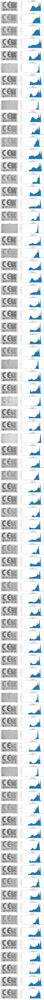

In [6]:
fig, axs = plt.subplots(len(image_files), 2, figsize=(15, 4 * len(image_files)))
# Calculate the histograms and contrast metric, and populate the subplots

# Create an empty DataFrame to store contrast results
Contrast_data = {'Image': [], 'Contrast': []}
Contrast_df = pd.DataFrame(Contrast_data)


for i in range(len(image_files)):
    load = cv2.imread(image_files[i])
    img = cv2.cvtColor(load, cv2.COLOR_BGR2GRAY)
    selection = img.copy()
    
    #Syntax: cv2.calcHist(images, channels, mask, histSize, ranges[, hist[, accumulate]])
    hist = cv2.calcHist([img], [0], None, [256], [0, 256])

    # Display the image
    axs[i, 0].imshow(selection, cmap='gray', vmin=0, vmax=256)
    axs[i, 0].set_title(f'{basename(image_files[i])}')
 
    # Display the histogram
    axs[i, 1].hist(img.ravel(),bins = 256,range=[0, 256])
    axs[i, 1].set_title(f'Histogram {i+1}\nContrast: {np.std(img)}')
    axs[i, 1].set_xlabel('Intensity Value')
    axs[i, 1].set_ylabel('Count')
    axs[i, 1].set_xlim([0, 256])

    # Add results to the DataFrame
    Contrast_data['Image'].append(basename(image_files[i]))
    Contrast_data['Contrast'].append(np.std(img))

# Save the DataFrame to a CSV file
Contrast_df = pd.DataFrame(Contrast_data)
Contrast_df.to_csv('Contrast_results_DOE__UV_PP_white.csv', index=False)

plt.tight_layout()
plt.show()